In [2]:
%load_ext autoreload
%autoreload 2
import random
import numpy as np
import torch
import matplotlib.pyplot as plt


In [3]:
import random
import numpy as np
import torch
import matplotlib.pyplot as plt

seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)

from mixture_lower import Mixture
from guided_models import Diffusion
from chernoff_gpt import ChernoffGuidance

results = {}

# Diffusion parameters
n = T = 20
t_vals = np.arange(1, n+1)
c, delta = 4, 0.02
inner = delta * (1 + c * np.log(n) / n)**t_vals
alpha_t = 1 - (c * np.log(n) / n) * np.minimum(inner, 1)
alpha_t[0] = 1 - delta
d = 2

# Mixture setup
mu_0 = np.array([[5, 0], [-5, 0]])
var_0 = np.eye(d)
pi_0 = np.array([0.95, 0.05])
pi_0 /= np.sum(pi_0)
dist0 = Mixture(mu_0, var_0, pi_0)
diffusion_unguided = Diffusion(dist0, alpha_t, S=50_000)
# X_unguided = diffusion_unguided.calc_samples()
unguided_num_steps = T*50_000

X = diffusion_unguided.calc_samples()



Reverse Diffusion Progress: 100%|██████████| 19/19 [00:22<00:00,  1.19s/it]


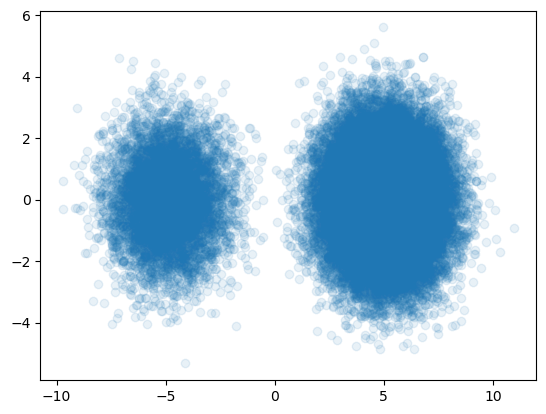

In [4]:
plt.scatter(X[:, -1, 0], X[:, -1, 1], alpha=0.1)

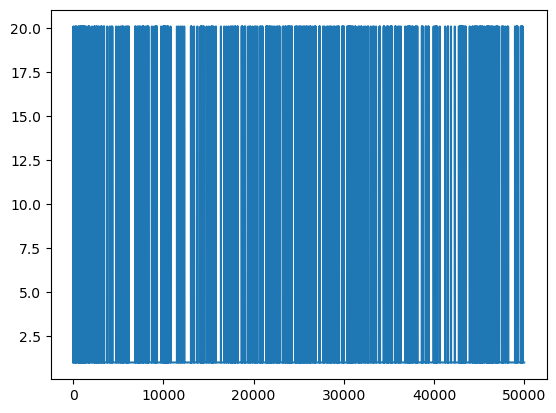

In [5]:
B = 3
def reward_func_hard(x):
    """
    Hard step function for 2D input.
    Returns B when x[..., 0] < -7, and 0 otherwise.
    """
    x0 = np.asarray(x)[..., 0]
    return np.where(x0 < -7, B, 0)

expr = np.exp(reward_func_hard(X[:, -1, :]))
plt.plot(expr)

In [ ]:
from value_estimator import ValueEstimate
val_ensemble = ValueEstimate(X, expr, [128, 500, 500])
val_ensemble.train()


Building ValueEstimate...
[Epoch 01] avg MSE: 2.4624
[Epoch 02] avg MSE: 2.3473
[Epoch 03] avg MSE: 2.1926
[Epoch 04] avg MSE: 2.0929
[Epoch 05] avg MSE: 2.0627
[Epoch 06] avg MSE: 2.0508
[Epoch 07] avg MSE: 2.0393
[Epoch 08] avg MSE: 2.0318
[Epoch 09] avg MSE: 2.0237
[Epoch 10] avg MSE: 2.0179
[Epoch 11] avg MSE: 2.0169
[Epoch 12] avg MSE: 2.0108
[Epoch 13] avg MSE: 2.0041
[Epoch 14] avg MSE: 2.0028
[Epoch 15] avg MSE: 1.9994
[Epoch 16] avg MSE: 1.9946
[Epoch 17] avg MSE: 1.9907


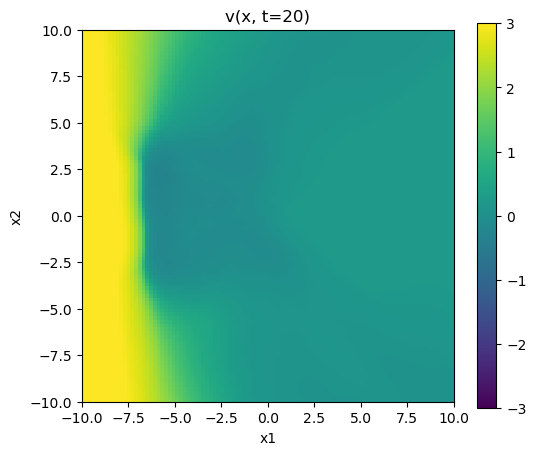

In [ ]:
from matplotlib import animation

# Create a grid of x values
x1 = np.linspace(-10, 10, 100)
x2 = np.linspace(-10, 10, 100)
xx1, xx2 = np.meshgrid(x1, x2)
grid_x = np.stack([xx1.ravel(), xx2.ravel()], axis=1)

fig, ax = plt.subplots(figsize=(6, 5))
cax = ax.imshow(np.zeros_like(xx1), extent=[-10, 10, -10, 10], origin='lower', vmin=-B, vmax=B)
plt.xlabel('x1')
plt.ylabel('x2')
plt.title('v(x, t) over time')
cb = fig.colorbar(cax)

t_vals = list(range(1, n + 1))

def animate(t_idx):
    t = t_vals[t_idx]
    t_arr = np.full((grid_x.shape[0],), t)
    v = val_ensemble.predict_under_log(grid_x, t_arr)
    v = np.squeeze(v)
    v_img = v.reshape(xx1.shape)
    cax.set_data(v_img)
    ax.set_title(f'v(x, t={t})')
    return [cax]

ani = animation.FuncAnimation(fig, animate, frames=len(t_vals), interval=100, blit=True)
ani.save('v_under_log_over_time_differentiable.gif', writer='pillow', fps=2)
plt.show()

In [ ]:
chernoff_guided = ChernoffGuidance(dist0, alpha_t, lambda t, x: (np.log(np.clip(val_ensemble.predict(x, t), np.e**(-B), np.e**B))), iters = 400, fix_lambda=False, verbose = True)

In [ ]:
X_train = chernoff_guided.train_baselines_and_sample(lam_init = 15)

Chernoff backward:   0%|          | 0/19 [00:00<?, ?it/s]

[loop] t=18 Ytp1.shape=(10000, 2)
Training baseline and lambda at step t=18 ...
[train_b] t=18 Ytp1.shape=(10000, 2) N=10000 d=2 fix_lambda=False lambda_value=0.5


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.500001 t1=0.202167 t2=-0.192863 t3=13.815483 erm=0.000000 loss=13.824787
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.731601 t1=0.205595 t2=-0.196698 t3=9.441976 erm=0.000000 loss=9.450872
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=18:  35%|███▌      | 106/300 [00:03<00:06, 30.98it/s]

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.923586 t1=0.211589 t2=-0.203148 t3=7.479280 erm=0.000000 loss=7.487720
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.088479 t1=0.211108 t2=-0.202335 t3=6.346245 erm=0.000000 loss=6.355019


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.233568 t1=0.213054 t2=-0.204332 t3=5.599815 erm=0.000000 loss=5.608538
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=18: 100%|██████████| 300/300 [00:09<00:00, 30.07it/s]

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=1.3635 lme=0.297045 base_tau=5.284050 erm=0.000000 tau=5.284050
[loop] t=18 lambda_t=1.363499 tau_t=5.284050
[guide] t=18 K=10000 d=2 tau=5.284050
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-5.071414 min=-5.533516 max=-2.651256
[[0.0063519  0.00664737 0.00632018 ... 0.00643393 0.00662134 0.00658222]
 [0.00654499 0.00671351 0.00682161 ... 0.00647551 0.00637259 0.00685724]
 [0.00674566 0.00583573 0.00670566 ... 0.00667822 0.00668629 0.00654723]
 ...
 [0.0066002  0.00647535 0.0063436  ... 0.00628817 0.00626706 0.0065566 ]
 [0.00598115 0.00612588 0.00626308 ... 0.00663895 0.006239

Chernoff backward:   5%|▌         | 1/19 [00:57<17:15, 57.52s/it]

[value_eval] t(array)=[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1] -> t_mapped=[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1] X.shape=(16, 2) -> v.shape=(16,)
[guide] active=1 Xprop.shape=(16, 1, 2) v_vals.shape=(16, 1) logu_vals.shape=(1,)
[guide] accept_log_exponent.shape=(16, 1) mean=-5.249402 min=-5.427619 max=-5.146603
[[0.0051615 ]
 [0.00564452]
 [0.0044362 ]
 [0.00581914]
 [0.00550824]
 [0.00513947]
 [0.00508579]
 [0.00567784]
 [0.00546963]
 [0.00553523]
 [0.00439355]
 [0.00531529]
 [0.00510184]
 [0.00473409]
 [0.00580185]
 [0.00547912]]
[value_eval] t(array)=[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1] -> t_mapped=[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1] X.shape=(16, 2) -> v.shape=(16,)
[guide] active=1 Xprop.shape=(16, 1, 2) v_vals.shape=(16, 1) logu_vals.shape=(1,)
[guide] accept_log_exponent.shape=(16, 1) mean=-5.296213 min=-5.445196 max=-5.167459
[[0.00431699]
 [0.00463244]
 [0.00470019]
 [0.00466304]
 [0.0053607 ]
 [0.00569903]
 [0.005158  ]
 [0.00529621]
 [0.00567497]
 [0.00490982]
 [0.00494242]
 [0.00488071]
 [0

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.500001 t1=0.218021 t2=-0.211449 t3=13.815483 erm=0.000000 loss=13.822056
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.923593 t1=0.231407 t2=-0.224265 t3=7.479218 erm=0.000000 loss=7.486359
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.088482 t1=0.231973 t2=-0.225561 t3=6.346228 erm=0.000000 loss=6.352639
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.233557 t1=0.232661 t2=-0.225084 t3=5.599868 erm=0.000000 loss=5.607445


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=17: 100%|██████████| 300/300 [00:09<00:00, 31.44it/s]

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=1.3635 lme=0.322778 base_tau=5.303028 erm=0.000000 tau=5.303028
[loop] t=17 lambda_t=1.363473 tau_t=5.303028
[guide] t=17 K=10000 d=2 tau=5.303028
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-5.070495 min=-5.497005 max=-2.685941
[[0.00638322 0.00661692 0.00679795 ... 0.00643623 0.00580013 0.0062257 ]
 [0.00666774 0.00654205 0.00644138 ... 0.00619825 0.00612382 0.00652306]
 [0.00656699 0.0062289  0.00646812 ... 0.00572893 0.00592157 0.00623086]
 ...
 [0.0064891  0.00645073 0.00636375 ... 0.00619836 0.00596758 0.00660063]
 [0.00587181 0.00664823 0.00641013 ... 0.00614864 0.005843

Chernoff backward:  11%|█         | 2/19 [01:54<16:12, 57.19s/it]

[value_eval] t(array)=[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2] -> t_mapped=[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2] X.shape=(80, 2) -> v.shape=(80,)
[guide] active=5 Xprop.shape=(16, 5, 2) v_vals.shape=(16, 5) logu_vals.shape=(5,)
[guide] accept_log_exponent.shape=(16, 5) mean=-5.135039 min=-5.376400 max=-4.952456
[[0.00586709 0.00521366 0.00611741 0.00619927 0.00636915]
 [0.00560675 0.00462444 0.00607449 0.00698063 0.00576541]
 [0.00610603 0.00529468 0.00603936 0.00683182 0.00633308]
 [0.00597433 0.00519116 0.00554103 0.00659475 0.00597396]
 [0.00537924 0.00488414 0.00615528 0.00694415 0.00615436]
 [0.00568031 0.005505   0.00625962 0.00699416 0.00631925]
 [0.00560445 0.00501059 0.00627823 0.00611848 0.00626799]
 [0.00594003 0.00510423 0.006039

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.500001 t1=0.240863 t2=-0.236607 t3=13.815483 erm=0.000000 loss=13.819739
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.731618 t1=0.245985 t2=-0.241956 t3=9.441746 erm=0.000000 loss=9.445775
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.088507 t1=0.252751 t2=-0.245022 t3=6.346085 erm=0.000000 loss=6.353814
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.233572 t1=0.251288 t2=-0.246095 t3=5.599799 erm=0.000000 loss=5.604991
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=16: 100%|██████████| 300/300 [00:09<00:00, 31.12it/s]

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=1.3634 lme=0.345940 base_tau=5.320167 erm=0.000000 tau=5.320167
[loop] t=16 lambda_t=1.363434 tau_t=5.320167
[guide] t=16 K=10000 d=2 tau=5.320167
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-5.073473 min=-5.524606 max=-2.694355
[[0.00631575 0.00655524 0.00648396 ... 0.00645817 0.00593014 0.00645704]
 [0.0061579  0.00666744 0.00707442 ... 0.00582577 0.00601844 0.00569777]
 [0.00609119 0.00657557 0.00674867 ... 0.00643743 0.00634279 0.00600543]
 ...
 [0.00647483 0.00653373 0.00659193 ... 0.0062176  0.00613639 0.00638632]
 [0.0061782  0.00663789 0.00661503 ... 0.00588678 0.006234

Chernoff backward:  16%|█▌        | 3/19 [02:53<15:24, 57.81s/it]

[value_eval] t(array)=[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3] -> t_mapped=[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3] X.shape=(16, 2) -> v.shape=(16,)
[guide] active=1 Xprop.shape=(16, 1, 2) v_vals.shape=(16, 1) logu_vals.shape=(1,)
[guide] accept_log_exponent.shape=(16, 1) mean=-5.036571 min=-5.126026 max=-4.990286
[[0.00618524]
 [0.00615193]
 [0.00645056]
 [0.00669632]
 [0.00633876]
 [0.00657724]
 [0.00594012]
 [0.0066292 ]
 [0.00680372]
 [0.00650229]
 [0.0065293 ]
 [0.00677284]
 [0.00666799]
 [0.00660139]
 [0.00677782]
 [0.00638334]]
[value_eval] t(array)=[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3] -> t_mapped=[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3] X.shape=(16, 2) -> v.shape=(16,)
[guide] active=1 Xprop.shape=(16, 1, 2) v_vals.shape=(16, 1) logu_vals.shape=(1,)
[guide] accept_log_exponent.shape=(16, 1) mean=-5.060832 min=-5.141729 max=-4.975640
[[0.00640419]
 [0.00622207]
 [0.00667099]
 [0.0065229 ]
 [0.0069041 ]
 [0.00625176]
 [0.00625271]
 [0.00650823]
 [0.00609838]
 [0.00668613]
 [0.00626581]
 [0.00629032]
 [0

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.500001 t1=0.258523 t2=-0.254473 t3=13.815483 erm=0.000000 loss=13.819533
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1


Chernoff b_(t+1) @ t=15:   2%|▏         | 7/300 [00:00<00:09, 30.63it/s]

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.731614 t1=0.256622 t2=-0.250524 t3=9.441802 erm=0.000000 loss=9.447900
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.923599 t1=0.265709 t2=-0.255110 t3=7.479167 erm=0.000000 loss=7.489767
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.088479 t1=0.256008 t2=-0.249120 t3=6.346247 erm=0.000000 loss=6.353135
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=15:  72%|███████▏  | 216/300 [00:07<00:02, 29.65it/s]

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.233540 t1=0.254280 t2=-0.248074 t3=5.599945 erm=0.000000 loss=5.606151
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

Chernoff b_(t+1) @ t=15: 100%|██████████| 300/300 [00:09<00:00, 30.40it/s]

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=1.3634 lme=0.348053 base_tau=5.321686 erm=0.000000 tau=5.321686
[loop] t=15 lambda_t=1.363442 tau_t=5.321686
[guide] t=15 K=10000 d=2 tau=5.321686
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-5.069444 min=-5.459243 max=-2.406054
[[0.00645978 0.00663288 0.0059381  ... 0.00587041 0.00671488 0.00605468]
 [0.00651237 0.00673964 0.00681294 ... 0.00624919 0.00581633 0.00564423]
 [0.0066975  0.00658167 0.00673374 ... 0.00591046 0.00648125 0.00609254]
 ...
 [0.00645567 0.00656237 0.00613795 ... 0.00551127 0.0061869  0.00593208]
 [0.00686094 0.00643018 0.00650652 ... 0.00595951 0.006218

Chernoff backward:  21%|██        | 4/19 [03:54<14:46, 59.09s/it]

[value_eval] t(array)=[4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4] -> t_mapped=[4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4] X.shape=(224, 2) -> v.shape=(224,)
[guide] active=14 X

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.500001 t1=0.262192 t2=-0.256653 t3=13.815483 erm=0.000000 loss=13.821023
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.731593 t1=0.255745 t2=-0.249487 t3=9.442070 erm=0.000000 loss=9.448328
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.923554 t1=0.260357 t2=-0.251629 t3=7.479537 erm=0.000000 loss=7.488266
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.088405 t1=0.258762 t2=-0.246451 t3=6.346680 erm=0.000000 loss=6.358992
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.233446 t1=0.264069 t2=-0.249371 t3=5.600373 erm=0.000000 loss=5.615071
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=14: 100%|██████████| 300/300 [00:09<00:00, 30.97it/s]


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=1.3633 lme=0.350227 base_tau=5.323714 erm=0.000000 tau=5.323714
[loop] t=14 lambda_t=1.363331 tau_t=5.323714
[guide] t=14 K=10000 d=2 tau=5.323714
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-5.074589 min=-5.442313 max=-2.515264
[[0.00578112 0.00640584 0.00631981 ... 0.00562481 0.00572535 0.00607033]
 [0.00597865 0.00622012 0.00636158 ... 0.00515031 0.00630608 0.00550903]
 [0.00623485 0.00659306 

Chernoff backward:  26%|██▋       | 5/19 [04:52<13:41, 58.71s/it]

[value_eval] t(array)=[5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5] -> t_mapped=[5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.500001 t1=0.246723 t2=-0.239608 t3=13.815483 erm=0.000000 loss=13.822598
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.731573 t1=0.244480 t2=-0.236151 t3=9.442333 erm=0.000000 loss=9.450662
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.923512 t1=0.251445 t2=-0.240863 t3=7.479880 erm=0.000000 loss=7.490462
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=13: 100%|██████████| 300/300 [00:09<00:00, 30.31it/s]


[pairs] t=13 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=1.3631 lme=0.337544 base_tau=5.315313 erm=0.000000 tau=5.315313
[loop] t=13 lambda_t=1.363100 tau_t=5.315313
[guide] t=13 K=10000 d=2 tau=5.315313
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-5.076549 min=-5.495475 max=-2.561624
[[0.00596164 0.0060774  0.00655852 ... 0.00546842 0.00733873 0.00600444]
 [0.00576185 0.00639086 0.00607863 ... 0.00663899 0.00612743 0.00560592]
 [0.00655728 0.00605528 0.00590348 ... 0.00656155 0.00754406 0.00569123]
 ...
 [0.00582716 0.00640398 0.00619365 ... 0.00559688 0.00509108 0.00638193]
 [0.00592185 0.00624278 0.00661579 ... 0.00577323 0.005447

Chernoff backward:  32%|███▏      | 6/19 [05:50<12:40, 58.49s/it]

[value_eval] t(array)=[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6] -> t_mapped=[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.500001 t1=0.233793 t2=-0.223948 t3=13.815483 erm=0.000000 loss=13.825328


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.923466 t1=0.235241 t2=-0.222099 t3=7.480252 erm=0.000000 loss=7.493394
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=12: 100%|██████████| 300/300 [00:10<00:00, 29.87it/s]


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=1.3629 lme=0.326359 base_tau=5.307705 erm=0.000000 tau=5.307705
[loop] t=12 lambda_t=1.362946 tau_t=5.307705
[guide] t=12 K=10000 d=2 tau=5.307705
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-5.083446 min=-5.451864 max=-2.598157
[[0.00646473 0.00595168 0.00594746 ... 0.00715845 0.00546893 0.00573298]
 [0.00645967 0.00590613 0.00560147 ... 0.00575678 0.00561288 0.00562944]
 [0.00682229 0.00593028 

Chernoff backward:  37%|███▋      | 7/19 [06:50<11:49, 59.15s/it]

[value_eval] t(array)=[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7] -> t_mapped=[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.500001 t1=0.223463 t2=-0.206961 t3=13.815483 erm=0.000000 loss=13.831985
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.731533 t1=0.217077 t2=-0.198937 t3=9.442843 erm=0.000000 loss=9.460983
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.923399 t1=0.210825 t2=-0.196227 t3=7.480793 erm=0.000000 loss=7.495392
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.233051 t1=0.211790 t2=-0.193187 t3=5.602164 erm=0.000000 loss=5.620768
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=11: 100%|██████████| 300/300 [00:09<00:00, 30.89it/s]

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=1.3628 lme=0.289312 base_tau=5.281117 erm=0.000000 tau=5.281117
[loop] t=11 lambda_t=1.362793 tau_t=5.281117
[guide] t=11 K=10000 d=2 tau=5.281117
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-5.078384 min=-5.515497 max=-2.547614
[[0.00596191 0.00614855 0.00602906 ... 0.00710486 0.00591125 0.00587906]
 [0.00637617 0.00639058 0.006669   ... 0.00574098 0.00638804 0.0060364 ]
 [0.0064606  0.00640287 0.00607257 ... 0.00697339 0.00690648 0.00577961]
 ...
 [0.00599888 0.00645732 0.00627573 ... 0.00755314 0.00683278 0.00585253]
 [0.00601001 0.00630021 0.00642738 ... 0.00555945 0.005307

Chernoff backward:  42%|████▏     | 8/19 [07:47<10:40, 58.26s/it]

[value_eval] t(array)=[8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8] -> t_mapped=[8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.500001 t1=0.191300 t2=-0.177862 t3=13.815483 erm=0.000000 loss=13.828920


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sh

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.731508 t1=0.188120 t2=-0.172314 t3=9.443172 erm=0.000000 loss=9.458979
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.923348 t1=0.186533 t2=-0.169670 t3=7.481204 erm=0.000000 loss=7.498067
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.088035 t1=0.189752 t2=-0.167290 t3=6.348835 erm=0.000000 loss=6.371296
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=10: 100%|██████████| 300/300 [00:09<00:00, 30.94it/s]


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=1.3625 lme=0.253003 base_tau=5.255578 erm=0.000000 tau=5.255578
[loop] t=10 lambda_t=1.362506 tau_t=5.255578
[guide] t=10 K=10000 d=2 tau=5.255578
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-5.086504 min=-5.632761 max=-2.550291
[[0.00590626 0.00621394 0.00599331 ... 0.00573593 0.00680331 0.00555296]
 [0.00618454 0.00669256 0.00628951 ... 0.00690725 0.00489483 0.00511457]
 [0.0061286  0.00609747 

Chernoff backward:  47%|████▋     | 9/19 [08:44<09:40, 58.07s/it]

[value_eval] t(array)=[9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9] -> t_mapped=[9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9] X.shape=(144, 2) -> v.shape=(144,)
[guide] active=9 Xprop.shape=(16, 9, 2) v_vals.shape=(16, 9) logu_vals.shape=(9,)
[guide] accept_log_exponent.shape=(16, 9) mean=-5.120778 min=-5.435938 max=-4.749752
[[0.00638315 0.00614074 0.00624322 0.00629873 0.00581276 0.00539214
  0.00569775 0.0053661  0.00470157]
 [0.00630679 0.00617731 0.00623155 0.00605126 0.00607091 0.00527853
  0.00

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.500001 t1=0.169951 t2=-0.151885 t3=13.815483 erm=0.000000 loss=13.833549
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(10

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.923244 t1=0.172931 t2=-0.149892 t3=7.482047 erm=0.000000 loss=7.505085
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(10

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.232580 t1=0.166337 t2=-0.128193 t3=5.604306 erm=0.000000 loss=5.642450
[pairs] t=9 Ytp1.shape=(10

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


Chernoff b_(t+1) @ t=9: 100%|██████████| 300/300 [00:09<00:00, 30.47it/s]

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=1.3621 lme=0.203095 base_tau=5.220351 erm=0.000000 tau=5.220351
[loop] t=9 lambda_t=1.362140 tau_t=5.220351
[guide] t=9 K=10000 d=2 tau=5.220351
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-5.092911 min=-5.684276 max=-2.543989
[[0.00606282 0.00587712 0.00608271 ... 0.006014   0.00643815 0.00575971]
 [0.00585522 0.00635148 0.00598896 ... 0.00621751 0.01460897 0.00557883]
 [0.0060404  0.00611633 0.00612055 ... 0.0060239  0.00402067 0.0057195 ]
 ...
 [0.00600937 0.00619403 0.00605838 ... 0.0060937  0.00576589 0.00561576]
 [0.00592413 0.006119   0.00586805 ..

Chernoff backward:  53%|█████▎    | 10/19 [09:42<08:41, 57.91s/it]

[value_eval] t(array)=[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10] -> t_mapped=[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10] X.shape=(64, 2) -> v.shape=(64,)
[guide] active=4 Xprop.shape=(16, 4, 2) v_vals.shape=(16, 4) logu_vals.shape=(4,)
[guide] accept_log_exponent.shape=(16, 4) mean=-5.087360 min=-5.159070 max=-4.957408
[[0.00635713 0.00599156 0.00654166 0.00604091]
 [0.00617988 0.00602036 0.00647091 0.00600591]
 [0.00626381 0.00589855 0.00638942 0.00603902]
 [0.00643318 0.0058803  0.00627924 0.00593515]
 [0.00627528 0.00598714 0.00661026 0.00703113]
 [0.00617878 0.0059453  0.0063326  0.00592696]
 [0.00605864 0.0060092  0.00627553 0.00594314]
 [0.00616679 0.00583448 0.00656881 0.00591686

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.500001 t1=0.138433 t2=-0.119496 t3=13.815483 erm=0.000000 loss=13.834420
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.731372 t1=0.153568 t2=-0.119866 t3=9.444930 erm=0.000000 loss=9.478632
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(102

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.922995 t1=0.148390 t2=-0.109416 t3=7.484066 erm=0.000000 loss=7.523040
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.087369 t1=0.121259 t2=-0.096314 t3=6.352724 erm=0.000000 loss=6.377668
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(10

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.231799 t1=0.139229 t2=-0.090754 t3=5.607857 erm=0.000000 loss=5.656332
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(10

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

Chernoff b_(t+1) @ t=8: 100%|██████████| 300/300 [00:09<00:00, 30.69it/s]


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=1.3610 lme=0.154305 base_tau=5.188924 erm=0.000000 tau=5.188924
[loop] t=8 lambda_t=1.360987 tau_t=5.188924
[guide] t=8 K=10000 d=2 tau=5.188924
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.sha

Chernoff backward:  58%|█████▊    | 11/19 [10:40<07:45, 58.13s/it]

[value_eval] t(array)=[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11] -> t_mapped=[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11] X.shape=(16, 2) -> v.shape=(16,)
[guide] active=1 Xprop.shape=(16, 1, 2) v_vals.shape=(16, 1) logu_vals.shape=(1,)
[guide] accept_log_exponent.shape=(16, 1) mean=-5.068715 min=-5.103484 max=-5.027765
[[0.00609951]
 [0.00615446]
 [0.00616979]
 [0.00607554]
 [0.00634891]
 [0.0063314 ]
 [0.00646796]
 [0.00655344]
 [0.00634519]
 [0.00625349]
 [0.00629819]
 [0.00626848]
 [0.00638027]
 [0.00637306]
 [0.00639175]
 [0.00615787]]
[value_eval] t(array)=[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11] -> t_mapped=[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11] X.shape=(16, 2) -> v.shape=(16,)
[guide] active=1 Xprop.shape=(16, 1, 2) v_vals.shape=(16, 1) logu_vals.shape=(1,)
[guide] accept_log_exponent.shape=(16, 1) mean=-5.075437 min=-5.104466 max=-5.050517
[[0.00640602]
 [0.00636064]
 [0.00630663]
 [0.0061098 ]
 [0.00632636]
 [0.00625991]
 [0.00624781]
 [0.00629

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.500001 t1=0.131007 t2=-0.098341 t3=13.815483 erm=0.000000 loss=13.848148
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(10

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.731202 t1=0.109712 t2=-0.077042 t3=9.447122 erm=0.000000 loss=9.479792
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 1

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.922572 t1=0.113381 t2=-0.064732 t3=7.487499 erm=0.000000 loss=7.536148
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(10

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.086705 t1=0.087525 t2=-0.041390 t3=6.356605 erm=0.000000 loss=6.402739
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.230933 t1=0.067504 t2=-0.024799 t3=5.611804 erm=0.000000 loss=5.654509
[pairs] t=7 Ytp1.shape=(10

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

Chernoff b_(t+1) @ t=7: 100%|██████████| 300/300 [00:09<00:00, 31.19it/s]

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=1.3599 lme=0.094598 base_tau=5.149120 erm=0.000000 tau=5.149120
[loop] t=7 lambda_t=1.359913 tau_t=5.149120
[guide] t=7 K=10000 d=2 tau=5.149120
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-5.120247 min=-6.486708 max=-2.823144
[[0.00561606 0.00613245 0.00626746 ... 0.00578434 0.00502928 0.00580465]
 [0.0056666  0.00617033 0.00627799 ... 0.00579001 0.00650761 0.00605235]
 [0.00557955 0.00624774 0.00606407 ... 0.00573426 0.00507542 0.00588129]
 ...
 [0.00563856 0.00612954 0.00621717 ... 0.00564696 0.00675653 0.00606419]
 [0.00578212 0.00611765 0.00621052 ..

Chernoff backward:  63%|██████▎   | 12/19 [11:41<06:52, 58.86s/it]

[value_eval] t(array)=[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12] -> t_mapped=[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12] X.shape=(128, 2) -> v.shape=(128,)
[guide] active=8 Xprop.shape=(16, 8, 2) v_vals.shape=(16, 8) logu_vals.shape=(8,)
[guide] accept_log_exponent.shape=(16, 8) mean=-5.131207 min=-5.490

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.500001 t1=0.041791 t2=-0.003328 t3=13.815483 erm=0.000000 loss=13.853947


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

Chernoff b_(t+1) @ t=6:  40%|████      | 120/300 [00:04<00:06, 29.34it/s]

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.922535 t1=0.028192 t2=0.037887 t3=7.487800 erm=0.000000 loss=7.553879
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.230868 t1=-0.007672 t2=0.084438 t3=5.612103 erm=0.000000 loss=5.688869
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(10

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

Chernoff b_(t+1) @ t=6: 100%|██████████| 300/300 [00:12<00:00, 23.61it/s]


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(ar

Chernoff backward:  68%|██████▊   | 13/19 [12:44<06:01, 60.23s/it]

[value_eval] t(array)=[13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13] -> t_mapped=[13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13] X.shape=(16, 2) -> v.shape=(16,)
[guide] active=1 Xprop.shape=(16, 1, 2) v_vals.shape=(16, 1) logu_vals.shape=(1,)
[guide] accept_log_exponent.shape=(16, 1) mean=-5.585718 min=-5.846366 max=-5.149899
[[0.00394408]
 [0.00362878]
 [0.00464704]
 [0.00374048]
 [0.00346948]
 [0.00349447]
 [0.00579999]
 [0.00289038]
 [0.00297712]
 [0.00306337]
 [0.00354069]
 [0.00370203]
 [0.00541262]
 [0.00304174]
 [0.00472407]
 [0.00326777]]
[value_eval] t(array)=[13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13] -> t_mapped=[13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13] X.shape=(16, 2) -> v.shape=(16,)
[guide] active=1 Xprop.shape=(16, 1, 2) v_vals.shape=(16, 1) logu_vals.shape=(1,)
[guide] accept_log_exponent.shape=(16, 1) mean=-5.556988 min=-5.910971 max=-4.508958
[[0.00402717]
 [0.0057668 ]
 [0.00329496]
 [0.00309804]
 [0.00270955]
 [0.00321202]
 [0.00365149]
 [0.00320

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.500001 t1=-0.083501 t2=0.151449 t3=13.815483 erm=0.000000 loss=13.883431
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(10

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

Chernoff b_(t+1) @ t=5:  19%|█▉        | 57/300 [00:02<00:08, 27.72it/s]

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.731082 t1=-0.061389 t2=0.133015 t3=9.448678 erm=0.000000 loss=9.520304
[pairs] t=5 Ytp1.shape=(102

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.922298 t1=-0.087690 t2=0.162424 t3=7.489718 erm=0.000000 loss=7.564451
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

Chernoff b_(t+1) @ t=5:  76%|███████▌  | 228/300 [00:10<00:02, 29.35it/s]

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.230326 t1=-0.132777 t2=0.228297 t3=5.614575 erm=0.000000 loss=5.710095
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(10

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

Chernoff b_(t+1) @ t=5: 100%|██████████| 300/300 [00:12<00:00, 23.56it/s]


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=1.359

Chernoff backward:  74%|███████▎  | 14/19 [13:53<05:14, 62.81s/it]

[value_eval] t(array)=[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14
 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14] -> t_mapped=[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14
 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14] X.shape=(48, 2) -> v.shape=(48,)
[guide] active=3 Xprop.shape=(16, 3, 2) v_vals.shape=(16, 3) logu_vals.shape=(3,)
[guide] accept_log_exponent.shape=(16, 3) mean=-5.722919 min=-6.008734 max=-4.701714
[[0.00420815 0.00344644 0.00316967]
 [0.00354325 0.0037003  0.0038563 ]
 [0.00311344 0.00304427 0.0031171 ]
 [0.00274426 0.00317923 0.0024572 ]
 [0.0032377  0.00323143 0.00272573]
 [0.00298633 0.00338653 0.00281602]
 [0.00292381 0.00315433 0.00331328]
 [0.00258647 0.00318917 0.00405034]
 [0.0028593  0.00379269 0.00270219]
 [0.00313028 0.00279541 0.00294607]
 [0.00434288 0.00304456 0.00280967]
 [0.00409043 0.0041785  0.00296436]
 [0.0090797  0.00314682 0.00259891]
 [0.

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.500001 t1=-0.203385 t2=0.295133 t3=13.815483 erm=0.000000 loss=13.907231
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.730950 t1=-0.193894 t2=0.297943 t3=9.450383 erm=0.000000 loss=9.554433
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)



Chernoff b_(t+1) @ t=4:  71%|███████▏  | 214/300 [00:20<00:03, 23.26it/s]

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=4: 100%|██████████| 300/300 [00:24<00:00, 12.26it/s]

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=1.3583 lme=-0.387346 base_tau=4.800398 erm=0.000000 tau=4.800398
[loop] t=4 lambda_t=1.358306 tau_t=4.800398
[guide] t=4 K=10000 d=2 tau=4.800398
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-5.160810 min=-6.551970 max=-3.818120
[[0.00586154 0.00545004 0.00588435 ... 0.00540094 0.0032012  0.0065023 ]
 [0.00586948 0.00544961 0.00602528 ... 0.005462   0.00583786 0.00645287]
 [0.00585162 0.00546157 0.00595613 ... 0.00546945 0.00239954 0.00653047]
 ...
 [0.00583241 0.00549227 0.00589559 ... 0.00548087 0.00521474 0.00641026]
 [0.00581204 0.00544699 0.00590913 .

Chernoff backward:  79%|███████▉  | 15/19 [15:12<04:30, 67.71s/it]

[value_eval] t(array)=[15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15
 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15
 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15] -> t_mapped=[15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15
 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15
 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15] X.shape=(64, 2) -> v.shape=(64,)
[guide] active=4 Xprop.shape=(16, 4, 2) v_vals.shape=(16, 4) logu_vals.shape=(4,)
[guide] accept_log_exponent.shape=(16, 4) mean=-5.891761 min=-6.152720 max=-4.839185
[[0.00248491 0.0046011  0.00233877 0.00244884]
 [0.00218953 0.00290746 0.00322536 0.00255178]
 [0.00264698 0.0079135  0.0024673  0.00228926]
 [0.00299238 0.00397305 0.00284311 0.00243383]
 [0.00235894 0.00282393 0.00234306 0.00361388]
 [0.00237798 0.0022152  0.00227446 0.00228665]
 [0.00265248 0.00212769 0.00251276 0.00230427]
 [0.00267471 0.00417894 0.00261031 0.00310873

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.500001 t1=-0.371492 t2=0.501692 t3=13.815483 erm=0.000000 loss=13.945683
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=3:  17%|█▋        | 52/300 [00:02<00:10, 22.57it/s]

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.730807 t1=-0.338728 t2=0.473665 t3=9.452230 erm=0.000000 loss=9.587168
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(102

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=3:  45%|████▌     | 135/300 [00:05<00:05, 29.44it/s]

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.085090 t1=-0.372844 t2=0.544172 t3=6.366065 erm=0.000000 loss=6.537393
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(10

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

Chernoff b_(t+1) @ t=3: 100%|██████████| 300/300 [00:12<00:00, 23.23it/s]


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=1.3571 lme=-0.590824 base_tau=4.654665 erm=0.000000 tau=4.654665
[loop] t=3 lambda_t=1.357119 tau_t=4.654665
[guide] t=3 K=10000 d=2 tau=4.654665
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapp

Chernoff backward:  84%|████████▍ | 16/19 [16:21<03:23, 67.96s/it]

[value_eval] t(array)=[16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16] -> t_mapped=[16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16] X.shape=(16, 2) -> v.shape=(16,)
[guide] active=1 Xprop.shape=(16, 1, 2) v_vals.shape=(16, 1) logu_vals.shape=(1,)
[guide] accept_log_exponent.shape=(16, 1) mean=-6.175119 min=-6.283496 max=-5.667459
[[0.00193948]
 [0.0020167 ]
 [0.00190442]
 [0.00208407]
 [0.00188981]
 [0.00233861]
 [0.00186686]
 [0.00215377]
 [0.00246671]
 [0.00191606]
 [0.00188426]
 [0.00186947]
 [0.00201101]
 [0.00204336]
 [0.00345664]
 [0.00188967]]
[value_eval] t(array)=[16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16] -> t_mapped=[16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16] X.shape=(16, 2) -> v.shape=(16,)
[guide] active=1 Xprop.shape=(16, 1, 2) v_vals.shape=(16, 1) logu_vals.shape=(1,)
[guide] accept_log_exponent.shape=(16, 1) mean=-6.173394 min=-6.325375 max=-5.695853
[[0.00182691]
 [0.00181591]
 [0.00217685]
 [0.00231543]
 [0.00335987]
 [0.00185519]
 [0.00197522]
 [0.00215

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.500001 t1=-0.556354 t2=0.721510 t3=13.815483 erm=0.000000 loss=13.980639
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(10

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

Chernoff b_(t+1) @ t=2:  13%|█▎        | 39/300 [00:02<00:11, 23.20it/s]

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.730588 t1=-0.491514 t2=0.658176 t3=9.455059 erm=0.000000 loss=9.621721
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(102

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.921035 t1=-0.529519 t2=0.712671 t3=7.499991 erm=0.000000 loss=7.683144
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(10

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=2: 100%|██████████| 300/300 [00:16<00:00, 18.30it/s]


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

Chernoff backward:  89%|████████▉ | 17/19 [17:35<02:19, 69.91s/it]

[value_eval] t(array)=[17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17] -> t_mapped=[17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17] X.shape=(16, 2) -> v.shape=(16,)
[guide] active=1 Xprop.shape=(16, 1, 2) v_vals.shape=(16, 1) logu_vals.shape=(1,)
[guide] accept_log_exponent.shape=(16, 1) mean=-6.366713 min=-6.462817 max=-6.064720
[[0.00177694]
 [0.00159411]
 [0.00232341]
 [0.00167436]
 [0.00170559]
 [0.00156039]
 [0.00164859]
 [0.00164838]
 [0.0016896 ]
 [0.00173555]
 [0.00156042]
 [0.00168742]
 [0.00219923]
 [0.00164094]
 [0.00161276]
 [0.00160503]]
[value_eval] t(array)=[17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17] -> t_mapped=[17 17 17 17 17 17 17 17 17 17 17 17 17 17 17 17] X.shape=(16, 2) -> v.shape=(16,)
[guide] active=1 Xprop.shape=(16, 1, 2) v_vals.shape=(16, 1) logu_vals.shape=(1,)
[guide] accept_log_exponent.shape=(16, 1) mean=-6.404019 min=-6.466420 max=-6.311146
[[0.00160161]
 [0.00167123]
 [0.00157359]
 [0.0016441 ]
 [0.00178162]
 [0.00162916]
 [0.00163983]
 [0.00155

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.500001 t1=-0.705181 t2=0.944228 t3=13.815483 erm=0.000000 loss=14.054531
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.730275 t1=-0.686052 t2=0.896977 t3=9.459109 erm=0.000000 loss=9.670034
[pairs] t=1 Ytp1.shape=(102

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.082949 t1=-0.704665 t2=0.974206 t3=6.378650 erm=0.000000 loss=6.648191
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(10

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.225739 t1=-0.729407 t2=1.015165 t3=5.635586 erm=0.000000 loss=5.921344
[pairs] t=1 Ytp1.shape=(10

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

Chernoff b_(t+1) @ t=1:  91%|█████████ | 273/300 [00:12<00:01, 21.57it/s]

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=1: 100%|██████████| 300/300 [00:14<00:00, 20.86it/s]


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=1.3534 lme=-1.026611 base_tau=4.345353 erm=0.000000 tau=4.345353
[loop] t=1 lambda_t=1.353433 tau_t=4.345353
[guide] t=1 K=10000 d=2 tau=4.345353
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-5.244785 min=-6.991208 max=-3.848086
[[0.00530189 0.00466269 0.00583254 ... 0.00464994 0.00129471 0.00673358]
 [0.00523575 0.00469257 0.00585866 ... 0.00460305 0.00124698 0.0

Chernoff backward:  95%|█████████▍| 18/19 [18:53<01:12, 72.35s/it]

[value_eval] t(array)=[18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18] -> t_mapped=[18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18] X.shape=(16, 2) -> v.shape=(16,)
[guide] active=1 Xprop.shape=(16, 1, 2) v_vals.shape=(16, 1) logu_vals.shape=(1,)
[guide] accept_log_exponent.shape=(16, 1) mean=-6.133133 min=-6.174205 max=-6.106932
[[0.00210764]
 [0.00213301]
 [0.0021331 ]
 [0.00220316]
 [0.00217332]
 [0.00220032]
 [0.00222737]
 [0.0022203 ]
 [0.00219774]
 [0.00220624]
 [0.0021831 ]
 [0.00218607]
 [0.00209746]
 [0.00218666]
 [0.00208246]
 [0.00218546]]
[loop] t=0 Ytp1.shape=(10000, 2)
Training baseline and lambda at step t=0 ...
[train_b] t=0 Ytp1.shape=(10000, 2) N=10000 d=2 fix_lambda=False lambda_value=0.5


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.500001 t1=-0.879065 t2=1.158989 t3=13.815483 erm=0.000000 loss=14.095407
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=0.919086 t1=-0.897155 t2=1.203176 t3=7.515898 erm=0.000000 loss=7.821920
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.080948 t1=-0.876912 t2=1.255970 t3=6.390461 erm=0.000000 loss=6.769519
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(10

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

Chernoff b_(t+1) @ t=0:  67%|██████▋   | 200/300 [00:10<00:04, 22.83it/s]

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=1.223031 t1=-0.917653 t2=1.306833 t3=5.648062 erm=0.000000 loss=6.037242
[pairs] t=0 Ytp1.shape=(10

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=0: 100%|██████████| 300/300 [00:13<00:00, 21.52it/s]

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=1.3501 lme=-1.258362 base_tau=4.184560 erm=0.000000 tau=4.184560
[loop] t=0 lambda_t=1.350057 tau_t=4.184560
[guide] t=0 K=10000 d=2 tau=4.184560
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-5.306133 min=-7.341859 max=-3.762867
[[0.0050111  0.00403834 0.00563659 ... 0.00432613 0.00094642 0.00672264]
 [0.00500329 0.00405168 0.0056145  ... 0.00431276 0.00091416 0.00676884]
 [0.0050025  0.00404111 0.00559655 ... 0.00432376 0.00092913 0.00671577]
 ...
 [0.00501069 0.00405149 0.00563365 ... 0.00433753 0.00096351 0.0067633 ]
 [0.00500248 0.00403782 0.00563638 .

Chernoff backward: 100%|██████████| 19/19 [20:22<00:00, 64.36s/it]

[value_eval] t(array)=[19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19] -> t_mapped=[19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19] X.shape=(48, 2) -> v.shape=(48,)
[guide] active=3 Xprop.shape=(16, 3, 2) v_vals.shape=(16, 3) logu_vals.shape=(3,)
[guide] accept_log_exponent.shape=(16, 3) mean=-7.060297 min=-7.190978 max=-6.800417
[[0.00090507 0.00076024 0.00085593]
 [0.0008139  0.00081027 0.00079123]
 [0.00088106 0.00082216 0.00082872]
 [0.00082613 0.00075335 0.00095044]
 [0.00083039 0.0007912  0.00078339]
 [0.00096957 0.00081291 0.00091721]
 [0.00086644 0.00081101 0.00088468]
 [0.00084239 0.00078492 0.00088439]
 [0.00084953 0.00088464 0.00096215]
 [0.0008624  0.00082695 0.00101628]
 [0.00083791 0.00079161 0.0008528 ]
 [0.00089602 0.00079515 0.00083861]
 [0.00087281 0.0007881  0.00111331]
 [0.

In [24]:
X_chern = chernoff_guided.calc_samples(5000)

[sample_only] S=5000 T=20 d=2
[sample_only] YT.shape=(5000, 2)


Chernoff inference:   0%|          | 0/19 [00:00<?, ?it/s]

[sample_only] t=18 Ytp1.shape=(5000, 2) tau=5.284050
[guide] t=18 K=5000 d=2 tau=5.284050
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(80000, 2) -> v.shape=(80000,)
[guide] active=5000 Xprop.shape=(16, 5000, 2) v_vals.shape=(16, 5000) logu_vals.shape=(5000,)
[guide] accept_log_exponent.shape=(16, 5000) mean=-5.511713 min=-6.794064 max=-3.569061
[[0.0043682  0.00453277 0.00400983 ... 0.0033286  0.00447622 0.00406208]
 [0.00441883 0.00453932 0.00346852 ... 0.00321026 0.00398927 0.00396644]
 [0.00444264 0.00445824 0.00413159 ... 0.00315262 0.00437799 0.00437576]
 ...
 [0.00451662 0.00452605 0.00387992 ... 0.00324245 0.00435256 0.0040625 ]
 [0.00459972 0.00440168 0.00419624 ... 0.00333128 0.00427682 0.00436041]
 [0.00463947 0.00459594 0.0039487  ... 0.00264238 0.0044533  0.0044062 ]]
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(75104, 2) -> v.shape=(75104,)
[guide] active=4694 Xprop.shape=(16, 4694, 2) v_vals.shape=(16, 46

Chernoff inference:   5%|▌         | 1/19 [00:39<11:45, 39.21s/it]

[value_eval] t(array)=[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1] -> t_mapped=[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1] X.shape=(16, 2) -> v.shape=(16,)
[guide] active=1 Xprop.shape=(16, 1, 2) v_vals.shape=(16, 1) logu_vals.shape=(1,)
[guide] accept_log_exponent.shape=(16, 1) mean=-5.844275 min=-6.083665 max=-5.720450
[[0.00309016]
 [0.00313161]
 [0.00261022]
 [0.00251605]
 [0.00309132]
 [0.00300292]
 [0.00255481]
 [0.00322332]
 [0.00312311]
 [0.00289975]
 [0.00327824]
 [0.00227981]
 [0.00303273]
 [0.00320425]
 [0.00304767]
 [0.00251949]]
[value_eval] t(array)=[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1] -> t_mapped=[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1] X.shape=(16, 2) -> v.shape=(16,)
[guide] active=1 Xprop.shape=(16, 1, 2) v_vals.shape=(16, 1) logu_vals.shape=(1,)
[guide] accept_log_exponent.shape=(16, 1) mean=-5.832133 min=-6.022337 max=-5.715885
[[0.0028738 ]
 [0.00246577]
 [0.00281942]
 [0.00317654]
 [0.00325813]
 [0.00316114]
 [0.00311714]
 [0.002424  ]
 [0.00303033]
 [0.00294135]
 [0.00265464]
 [0.00287914]
 [0

Chernoff inference:   5%|▌         | 1/19 [01:11<21:26, 71.45s/it]

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(20976, 2) -> v.shape=(20976,)
[guide] active=1311 Xprop.shape=(16, 1311, 2) v_vals.shape=(16, 1311) logu_vals.shape=(1311,)
[guide] accept_log_exponent.shape=(16, 1311) mean=-5.630541 min=-7.503108 max=-3.225800
[[0.00444152 0.00417389 0.00235295 ... 0.00436072 0.0044117  0.00408445]
 [0.00449501 0.00411679 0.00212914 ... 0.00446485 0.00417804 0.00416251]
 [0.0043166  0.00406708 0.0020484  ... 0.00449568 0.00434091 0.00394766]
 ...
 [0.00437717 0.00365743 0.00232575 ... 0.00443582 0.00419184 0.00418587]
 [0.00421914 0.00418106 0.00220479 ... 0.00451988 0.00439506 0.00367359]
 [0.00442826 0.00413071 0.00234269 ... 0.00435099 0.00399437 0.00415667]]


KeyboardInterrupt: 

In [1]:

chernoff_guided.num_steps

NameError: name 'chernoff_guided' is not defined

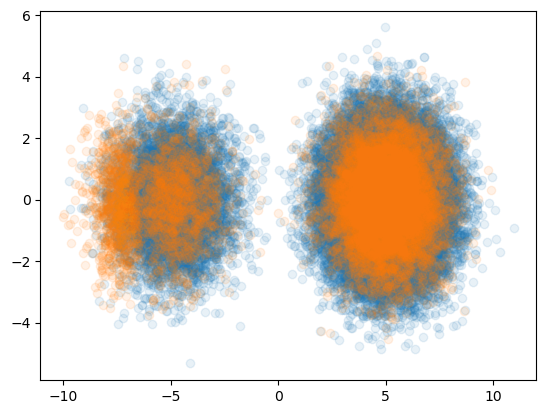

In [ ]:
plt.scatter(X[:, -1, 0], X[:, -1, 1], alpha=0.1)
plt.scatter(X_train[:, -1, 0], X_train[:, -1, 1], alpha=0.1)

# plt.scatter(X_chern[:, -1, 0], X_chern[:,-1, 1], alpha=0.1)

In [10]:
from guided_models import GuidedDiffusion
guided_per = GuidedDiffusion(dist0, alpha_t, lambda x, t: np.log(np.clip(val_ensemble.predict(x, t), np.e**(-B), np.e**B)), upper_bound=B, temperature=1, S=10_000)
X_per = guided_per.calc_samples()


Reverse Diffusion Progress: 100%|██████████| 19/19 [02:11<00:00,  6.92s/it]


In [11]:
B = 3
k = 2
L_r = B*k/4
from mixture_guidance import MixtureSpecificGuidance
diffusion_msg = MixtureSpecificGuidance(dist0, alpha_t, reward_func_hard, L_r = L_r, value_fn=lambda t, x: (np.log(np.clip(val_ensemble.predict(x, t), np.e**(-B), np.e**B))),   S = 10_000, delta = 0.01, use_trace = False)
X_msg = diffusion_msg.calc_samples()

Mixture reverse: 100%|██████████| 19/19 [00:58<00:00,  3.07s/it]


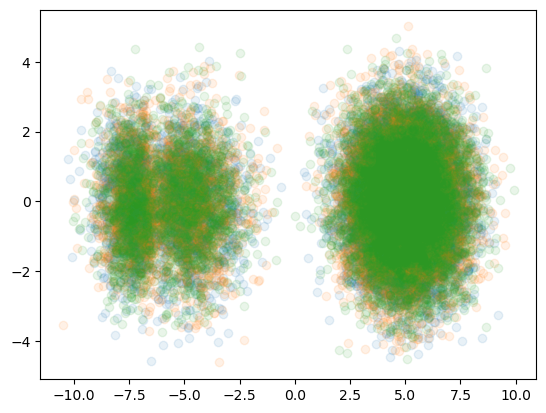

In [12]:
plt.scatter(X_per[:, -1, 0], X_per[:, -1, 1], alpha=0.1)
plt.scatter(X_msg[:, -1, 0], X_msg[:, -1, 1], alpha=0.1)
plt.scatter(X_train[:, -1, 0], X_train[:, -1, 1], alpha=0.1)


In [217]:
X_train.shape

(10000, 20, 2)

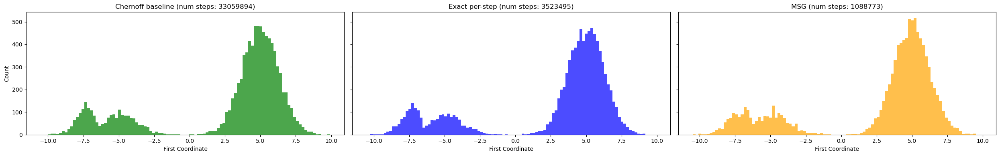

In [22]:
fig, axs = plt.subplots(1, 3, figsize=(25, 4), sharex=True, sharey=True)

axs[0].hist(X_train[:, -1, 0], bins=100, alpha=0.7, color='green')
axs[0].set_title('Chernoff baseline (num steps: {})'.format(chernoff_guided.num_steps))
axs[0].set_xlabel('First Coordinate')
axs[0].set_ylabel('Count')

axs[1].hist(X_per[:, -1, 0], bins=100, alpha=0.7, color='blue')
axs[1].set_title('Exact per-step (num steps: {})'.format(guided_per.num_steps))
axs[1].set_xlabel('First Coordinate')

axs[2].hist(X_msg[:, -1, 0], bins=100, alpha=0.7, color='orange')
axs[2].set_title('MSG (num steps: {})'.format(diffusion_msg.num_steps))
axs[2].set_xlabel('First Coordinate')


plt.tight_layout()
plt.show()

In [23]:
chernoff_guided.num_steps

33059894

In [15]:
diffusion_msg.num_steps

1088773

In [16]:
guided_per.num_steps

3523495

In [17]:
chernoff_guided.taus

array([4.18455982, 4.34535313, 4.50566769, 4.65466499, 4.80039835,
       4.93906116, 5.05847931, 5.14911985, 5.18892431, 5.22035122,
       5.25557804, 5.28111696, 5.3077054 , 5.31531286, 5.32371378,
       5.32168579, 5.32016659, 5.30302811, 5.28405046])

In [18]:
bl = chernoff_guided.baseline

In [20]:
def visualize_baseline_2d(baseline, t_scalar, grid_size=100, value_range=(-3, 3)):
        """
        Visualizes log u_{t+1}(y_{t+1}) over a 2D grid for d=2.
        Args:
            baseline: LogUBaselineNet instance
            t_scalar: time index (int)
            grid_size: number of points per axis
            value_range: tuple (min, max) for each axis
        """
        import matplotlib.pyplot as plt

        if baseline.d != 2:
            raise ValueError("Visualization only supported for d=2.")

        x = np.linspace(value_range[0], value_range[1], grid_size)
        y = np.linspace(value_range[0], value_range[1], grid_size)
        xx, yy = np.meshgrid(x, y)
        grid = np.stack([xx.ravel(), yy.ravel()], axis=1)  # (grid_size^2, 2)

        with torch.no_grad():
            grid_tensor = torch.tensor(grid, dtype=torch.float32, device=baseline.device)
            logu = baseline(grid_tensor, t_scalar).cpu().numpy().reshape(grid_size, grid_size)

        plt.figure(figsize=(6, 5))
        plt.imshow(logu, extent=(value_range[0], value_range[1], value_range[0], value_range[1]),
                   origin='lower', aspect='auto', cmap='viridis')
        plt.colorbar(label='log u')
        plt.title(f"log u_{{t+1}}(y_{{t+1}}), t={t_scalar}")
        plt.xlabel("y1")
        plt.ylabel("y2")
        plt.show()

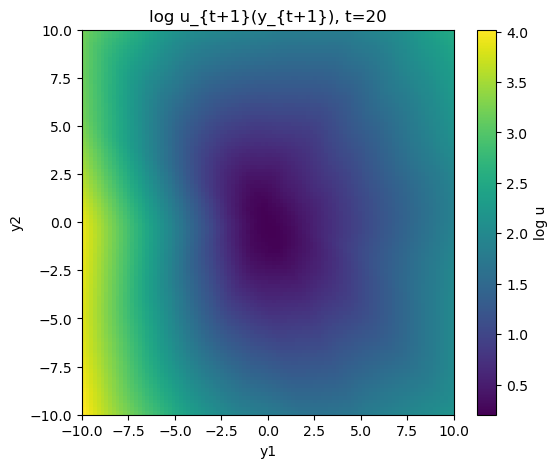

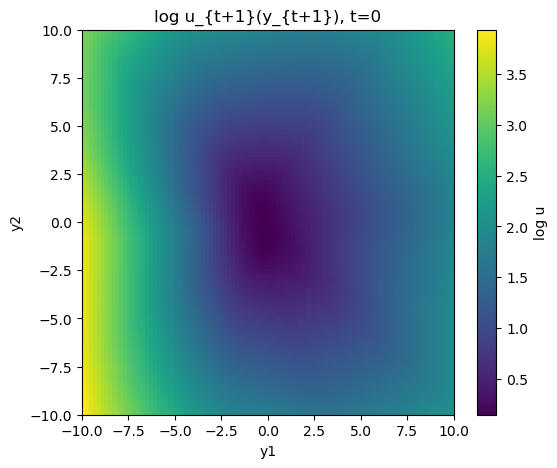

In [21]:
visualize_baseline_2d(bl, 20, grid_size=100, value_range=(-10, 10))
visualize_baseline_2d(bl, 0, grid_size=100, value_range=(-10, 10))

In [ ]:
chernoff_guided.lambdas